# MobileNetV2 — Augmentations and Full Fine-Tuning  
**Phase 3: Augmentation Application**  
In this stage of the optimisation pipeline, CutMix augmentations are applied to species most frequently misclassified by MobileNetV2. This phase focuses on addressing confusion pairs identified in earlier analysis, aiming to improve accuracy and model robustness.

Epoch 1/5: 100%|██████████| 225/225 [02:41<00:00,  1.39it/s]


Epoch 1: Train Acc: 54.28%, Val Acc: 95.20%


Epoch 2/5: 100%|██████████| 225/225 [02:28<00:00,  1.51it/s]


Epoch 2: Train Acc: 72.57%, Val Acc: 96.00%


Epoch 3/5: 100%|██████████| 225/225 [03:08<00:00,  1.19it/s]


Epoch 3: Train Acc: 76.00%, Val Acc: 96.40%


Epoch 4/5: 100%|██████████| 225/225 [03:17<00:00,  1.14it/s]


Epoch 4: Train Acc: 76.65%, Val Acc: 95.60%


Epoch 5/5: 100%|██████████| 225/225 [02:27<00:00,  1.52it/s]


Epoch 5: Train Acc: 77.42%, Val Acc: 96.80%


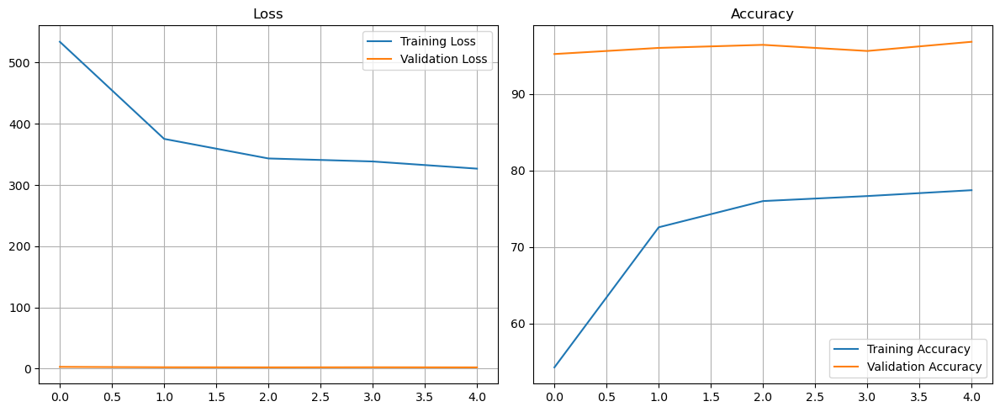

Test Accuracy: 98.00%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      0.80      0.89         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       1.00      1.00      1.00         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      0.80      0.89         5
    BLOTCHED EMERALD MOTH       1.00      1.00      1.00         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      0.80      0.89         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      0.80      0.89         5
         EMPEROR

In [ ]:
# Import necessary packages for MobileNetV2 with CutMix
# Core imports
from pathlib import Path
import os
import random

# Numerics
import numpy as np

# Plotting (for training/validation curves)
import matplotlib.pyplot as plt

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

# Torchvision
from torchvision import datasets, models
from torchvision.models import MobileNet_V2_Weights

# CutMix
from torchvision.transforms.v2 import CutMix

# Progress bar (for training loop)
from tqdm import tqdm

# Evaluation metrics
from sklearn.metrics import classification_report, confusion_matrix

# Set seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/kaggle-dataset/archive")

# Transforms - loads default pretrained weights for MobileNetV2 (trained on ImageNet)
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()

# Dictionary-style dataset and dataloader setup
data_transforms = {
    'train': transform,
    'valid': transform,
    'test': transform
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# CutMix setup
cutmix = CutMix(num_classes=num_classes)

def cutmix_collate(batch):
    imgs, targets = zip(*batch)
    imgs = torch.stack(imgs)
    targets = torch.tensor(targets)
    imgs, targets = cutmix(imgs, targets)
    return imgs, targets

# DataLoaders - only training uses CutMix
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=32, shuffle=True, 
                       num_workers=0, collate_fn=cutmix_collate),  # CutMix for training only
    'valid': DataLoader(image_datasets['valid'], batch_size=32, shuffle=False, num_workers=4),
    'test': DataLoader(image_datasets['test'], batch_size=32, shuffle=False, num_workers=4)
}

# Load MobileNetV2 model with pretrained weights
model = models.mobilenet_v2(weights=weights)
# Replace just the final classification layer 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

# unfreeze the last block only
for name, param in model.named_parameters():
    # Unfreeze only features.18 (last block) + classifier
    if "features.18" in name or "classifier" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

model.to(device)

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()
optimiser = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-4)

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 5

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimiser.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimiser.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y.argmax(1)).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")

In [19]:
torch.save(model.state_dict(), "mobilenet_v2_cutmix_only.pth")

### Attention Pattern Analysis after CutMix  

The analysis now examines how model attention patterns shift after the addition of CutMix augmentation.

In [ ]:
# Imports for Score-CAM image generation
import cv2
from PIL import Image
from pytorch_grad_cam import ScoreCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

# Load partially fine-tuned model with CutMix
model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_cutmix_only.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise all Banded Tiger Moth test images
image_path = "../data/kaggle-dataset/archive/test/BANDED TIGER MOTH/5.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

# Use the same transform as during training
weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

# Set target layer for Score-CAM
target_layer = model.features[18]  

# Run Score-CAM on the image
cam = ScoreCAM(model=model, target_layers=[target_layer])  

# Generate CAM heatmap 
grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

# Save output - This is repeated for all 5 test images
output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-cutmix-banded-tiger-5.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:14<00:00,  5.36it/s]


True

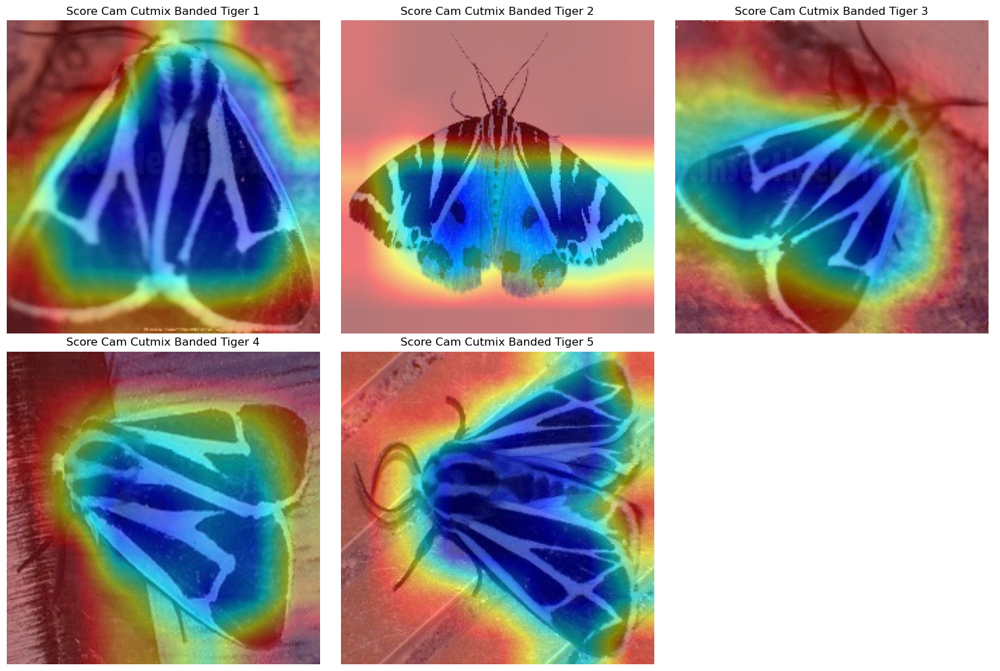

In [ ]:
# Import plotting package
import matplotlib.image as mpimg

# Define directory containing the images
base_path = Path("../cam_outputs/mobilenet_v2_ft") 

# Gather all Score-CAM images for Banded Tiger Moth with CutMix
image_paths = sorted(base_path.glob("score-cam-cutmix-banded-tiger-*.jpg"))

# Display settings
num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols
fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# Flatten axs for easy indexing
axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_cutmix_only.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise all Garden Tiger Moth test images
image_path = "../data/kaggle-dataset/archive/test/GARDEN TIGER MOTH/5.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-cutmix-garden-tiger-5.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:09<00:00,  8.49it/s]


True

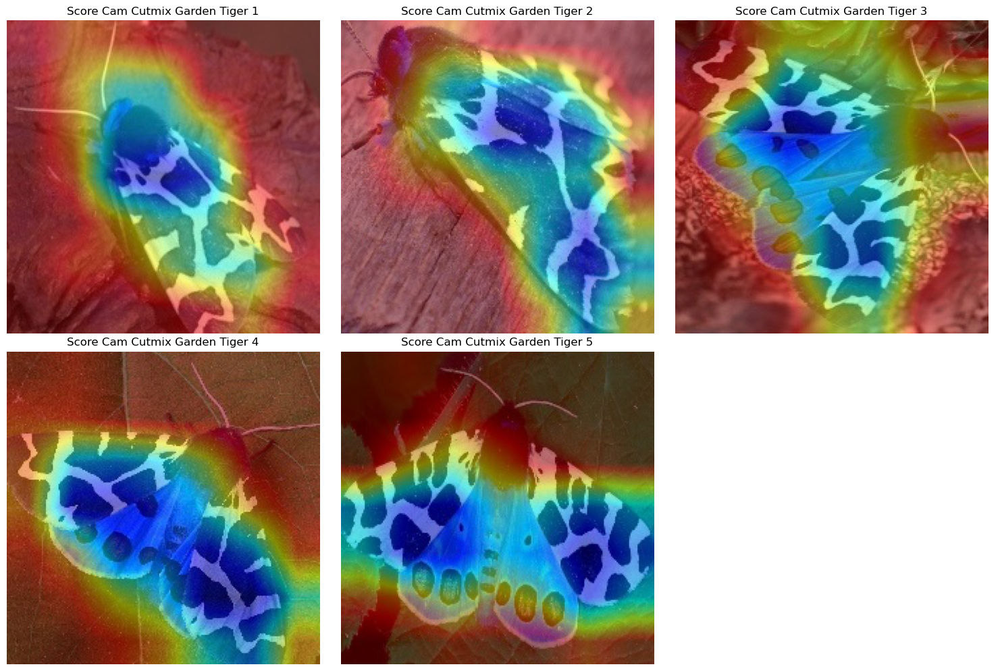

In [ ]:
base_path = Path("../cam_outputs/mobilenet_v2_ft") 

# Gather all Score-CAM images for Garden Tiger Moth
image_paths = sorted(base_path.glob("score-cam-cutmix-garden-tiger-*.jpg"))

num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols
fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()

### Standard Augmentation Addition

This stage applies standard image transformations to the MobileNetV2 model in order to improve generalisation and reduce overfitting.

Epoch 1/5: 100%|██████████| 225/225 [03:43<00:00,  1.01it/s]


Epoch 1: Train Acc: 51.25%, Val Acc: 94.40%


Epoch 2/5: 100%|██████████| 225/225 [03:29<00:00,  1.07it/s]


Epoch 2: Train Acc: 70.33%, Val Acc: 93.60%


Epoch 3/5: 100%|██████████| 225/225 [03:28<00:00,  1.08it/s]


Epoch 3: Train Acc: 71.39%, Val Acc: 96.00%


Epoch 4/5: 100%|██████████| 225/225 [03:11<00:00,  1.17it/s]


Epoch 4: Train Acc: 72.76%, Val Acc: 96.40%


Epoch 5/5: 100%|██████████| 225/225 [02:49<00:00,  1.33it/s]


Epoch 5: Train Acc: 74.11%, Val Acc: 96.40%


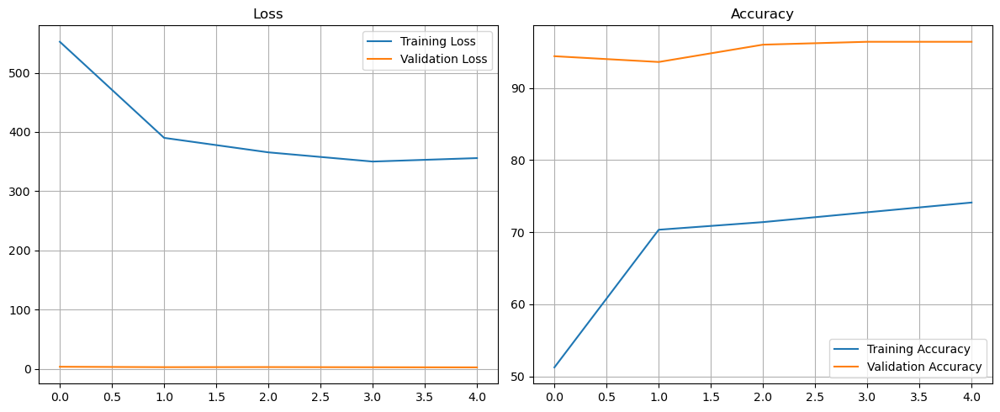

Test Accuracy: 99.20%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      1.00      1.00         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       1.00      1.00      1.00         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      0.80      0.89         5
    BLOTCHED EMERALD MOTH       1.00      1.00      1.00         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      1.00      1.00         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      1.00      1.00         5
         EMPEROR

In [ ]:
# Import necessary packages for MobileNetV2 with CutMix and standard augmentations
# Core imports
from pathlib import Path
import os
import random

# Numerics
import numpy as np

# Plotting (for training/validation curves)
import matplotlib.pyplot as plt

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

# Torchvision
from torchvision import transforms, datasets, models
from torchvision.models import MobileNet_V2_Weights

# CutMix
from torchvision.transforms.v2 import CutMix

# Progress bar (for training loop)
from tqdm import tqdm

# Evaluation metrics
from sklearn.metrics import classification_report, confusion_matrix

# Set seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/kaggle-dataset/archive")

# Transforms with standard augmentations added
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),                  # horizontal flip
    transforms.RandomRotation(15),                      # small rotations
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),   # lighting variations
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3, scale=(0.02, 0.15), ratio=(0.3, 3.3)) # Random erasing
])

transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Dictionary-style dataset and dataloader setup
data_transforms = {
    'train': transform_train,
    'valid': transform_val_test,
    'test': transform_val_test
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# CutMix setup
cutmix = CutMix(num_classes=num_classes)

def cutmix_collate(batch):
    imgs, targets = zip(*batch)
    imgs = torch.stack(imgs)
    targets = torch.tensor(targets)
    imgs, targets = cutmix(imgs, targets)
    return imgs, targets

# DataLoaders - only training uses CutMix
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=32, shuffle=True, 
                       num_workers=0, collate_fn=cutmix_collate),  # CutMix for training only
    'valid': DataLoader(image_datasets['valid'], batch_size=32, shuffle=False, num_workers=4),
    'test': DataLoader(image_datasets['test'], batch_size=32, shuffle=False, num_workers=4)
}

# Load MobileNetV2 model with pretrained weights
weights = MobileNet_V2_Weights.DEFAULT
model = models.mobilenet_v2(weights=weights)
# Replace just the final classification layer 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

# unfreeze the last block only
for name, param in model.named_parameters():
    # Unfreeze only features.18 (last block) + classifier
    if "features.18" in name or "classifier" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

model.to(device)

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-4)

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 5

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimizer.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y.argmax(1)).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")

In [35]:
torch.save(model.state_dict(), "mobilenet_v2_standard_augmentations.pth")

### Attention Pattern Analysis after Standard Augmentation Addition  

The analysis now examines how model attention patterns shift after the addition of Standard augmentations.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_standard_augmentations.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise all Blairs Mocha test images
image_path = "../data/kaggle-dataset/archive/test/BLAIRS MOCHA/5.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-standard-augmentations-blairs-mocha-5.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:14<00:00,  5.38it/s]


True

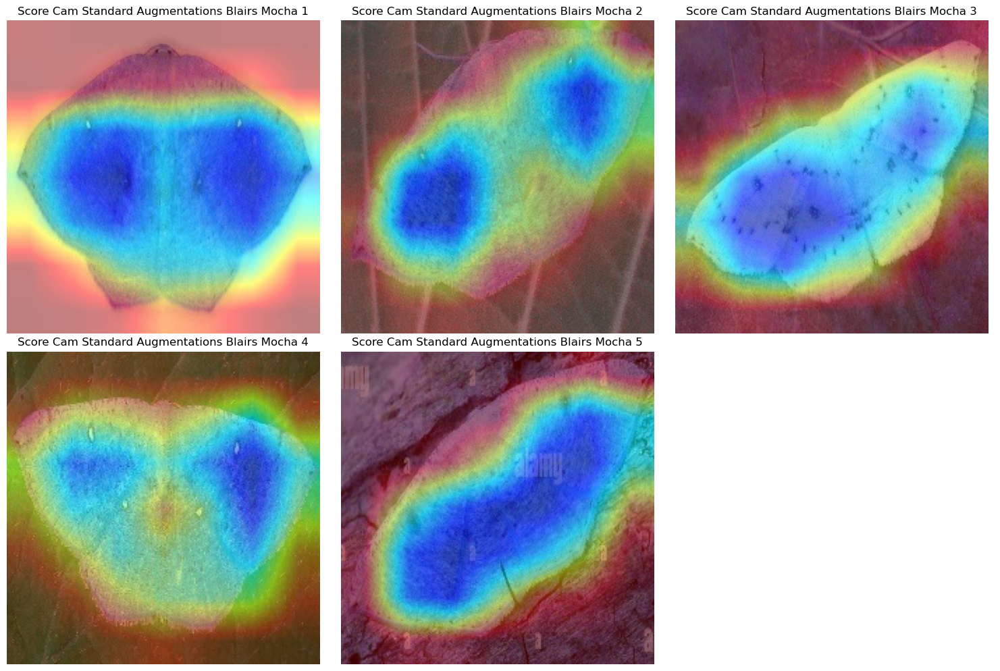

In [ ]:
base_path = Path("../cam_outputs/mobilenet_v2_ft") 

# Gather all Score-CAM images for Blairs Mocha with CutMix & standard augmentations
image_paths = sorted(base_path.glob("score-cam-standard-augmentations-blairs-mocha-*.jpg"))

num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols
fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_standard_augmentations.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise all Lace Border Moth test images
image_path = "../data/kaggle-dataset/archive/test/LACE BORDER MOTH/5.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-standard-augmentations-lace-border-5.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:13<00:00,  5.75it/s]


True

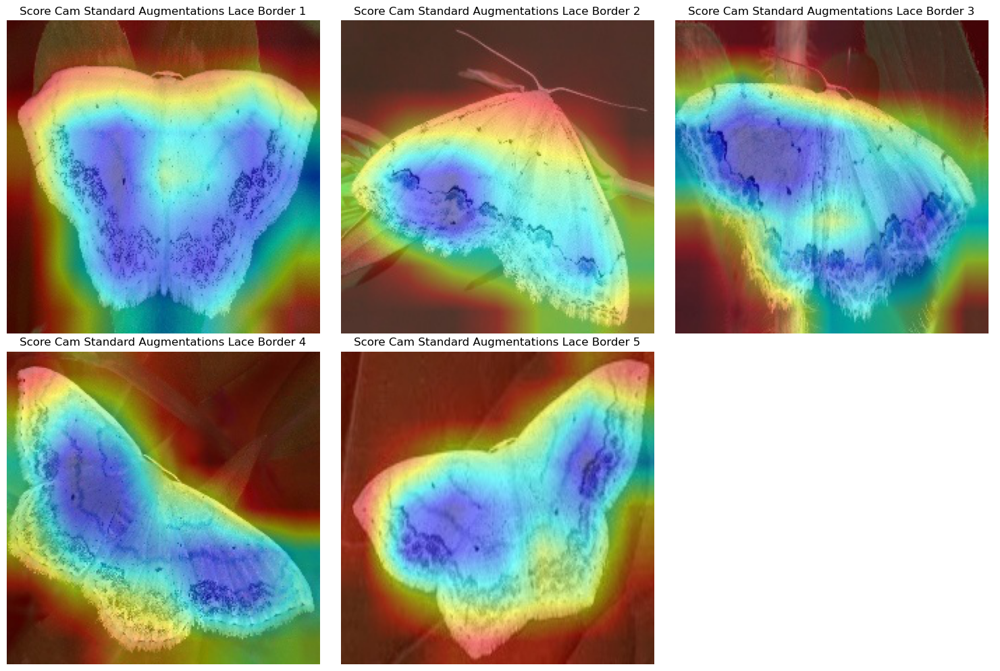

In [ ]:
base_path = Path("../cam_outputs/mobilenet_v2_ft") 

# Gather all Score-CAM images for Plume Moth with CutMix & standard augmentations
image_paths = sorted(base_path.glob("score-cam-standard-augmentations-lace-border-*.jpg"))

num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols
fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()

### Targeted Augmentation Addition

This stage applies targeted image transformations to the MobileNetV2 model in an effort to address persistantly confused species.

Epoch 1/5: 100%|██████████| 591/591 [08:41<00:00,  1.13it/s]


Epoch 1: Train Acc: 61.52%, Val Acc: 94.00%


Epoch 2/5: 100%|██████████| 591/591 [09:19<00:00,  1.06it/s]


Epoch 2: Train Acc: 71.19%, Val Acc: 94.80%


Epoch 3/5: 100%|██████████| 591/591 [06:24<00:00,  1.54it/s]


Epoch 3: Train Acc: 73.60%, Val Acc: 94.40%


Epoch 4/5: 100%|██████████| 591/591 [07:35<00:00,  1.30it/s]


Epoch 4: Train Acc: 76.22%, Val Acc: 94.00%


Epoch 5/5: 100%|██████████| 591/591 [08:55<00:00,  1.10it/s]


Epoch 5: Train Acc: 74.34%, Val Acc: 94.40%


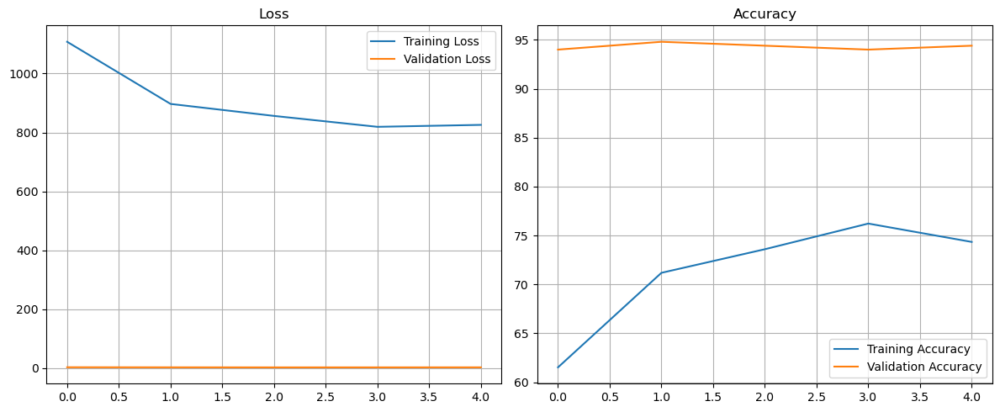

Test Accuracy: 98.80%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      0.80      0.89         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       0.83      1.00      0.91         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      1.00      1.00         5
    BLOTCHED EMERALD MOTH       0.83      1.00      0.91         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      1.00      1.00         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      1.00      1.00         5
         EMPEROR

In [ ]:
# Import necessary packages for MobileNetV2 with CutMix, standard augmentations, and targeted augmentations
# Core imports
from pathlib import Path
import os
import random

# Numerics
import numpy as np

# Plotting (for training/validation curves)
import matplotlib.pyplot as plt

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

# Torchvision
from torchvision import transforms, datasets, models
from torchvision.models import MobileNet_V2_Weights

# CutMix
from torchvision.transforms.v2 import CutMix

# Progress bar (for training loop)
from tqdm import tqdm

# Evaluation metrics
from sklearn.metrics import classification_report, confusion_matrix

# Set seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/targeted_augmented_dataset")

# Transforms with standard augmentations added
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),                  # horizontal flip
    transforms.RandomRotation(15),                      # small rotations
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1), # lighting variations
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3, scale=(0.02, 0.15), ratio=(0.3, 3.3)) # Random erasing

])

transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Dictionary-style dataset and dataloader setup
data_transforms = {
    'train': transform_train,
    'valid': transform_val_test,
    'test': transform_val_test
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# CutMix setup
cutmix = CutMix(num_classes=num_classes)

def cutmix_collate(batch):
    imgs, targets = zip(*batch)
    imgs = torch.stack(imgs)
    targets = torch.tensor(targets)
    imgs, targets = cutmix(imgs, targets)
    return imgs, targets

# DataLoaders - only training uses CutMix
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=32, shuffle=True, 
                       num_workers=0, collate_fn=cutmix_collate),  
    'valid': DataLoader(image_datasets['valid'], batch_size=32, shuffle=False, num_workers=4),
    'test': DataLoader(image_datasets['test'], batch_size=32, shuffle=False, num_workers=4)
}

# Load MobileNetV2 model with pretrained weights
weights = MobileNet_V2_Weights.DEFAULT
model = models.mobilenet_v2(weights=weights)
# Replace just the final classification layer 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

# unfreeze the last block only
for name, param in model.named_parameters():
    # Unfreeze only features.18 (last block) + classifier
    if "features.18" in name or "classifier" in name:
        param.requires_grad = True
    else:
        param.requires_grad = False

model.to(device)

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()
optimiser = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=1e-3, weight_decay=1e-4)

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 5

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimiser.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimiser.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y.argmax(1)).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")

In [56]:
torch.save(model.state_dict(), "mobilenet_v2_final_augmentations.pth")

### Attention Pattern Analysis after Targeted Augmentation Addition  

The analysis now examines how model attention patterns shift after the addition of Targeted augmentations.

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_final_augmentations.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise all Eyed Hawk Moth test images
image_path = "../data/kaggle-dataset/archive/test/EYED HAWK MOTH/5.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-augmentations-eyed-hawk-5.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:17<00:00,  4.45it/s]


True

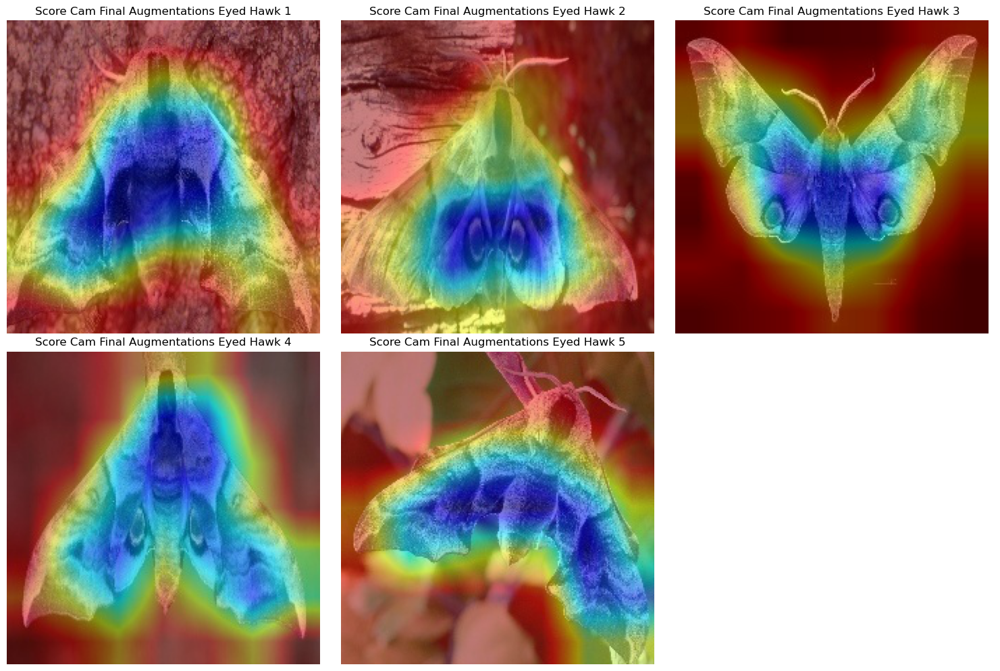

In [ ]:
base_path = Path("../cam_outputs/mobilenet_v2_ft") 

# Gather all Score-CAM images for Eyed Hawk Moth with CutMix, standard augmentations, and targeted augmentations
image_paths = sorted(base_path.glob("score-cam-final-augmentations-eyed-hawk-*.jpg"))

num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols
fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_final_augmentations.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise all Square Spot Rustic Moth test images
image_path = "../data/kaggle-dataset/archive/test/SQUARE SPOT RUSTIC MOTH/5.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-augmentations-square-spot-rustic-5.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:15<00:00,  5.25it/s]


True

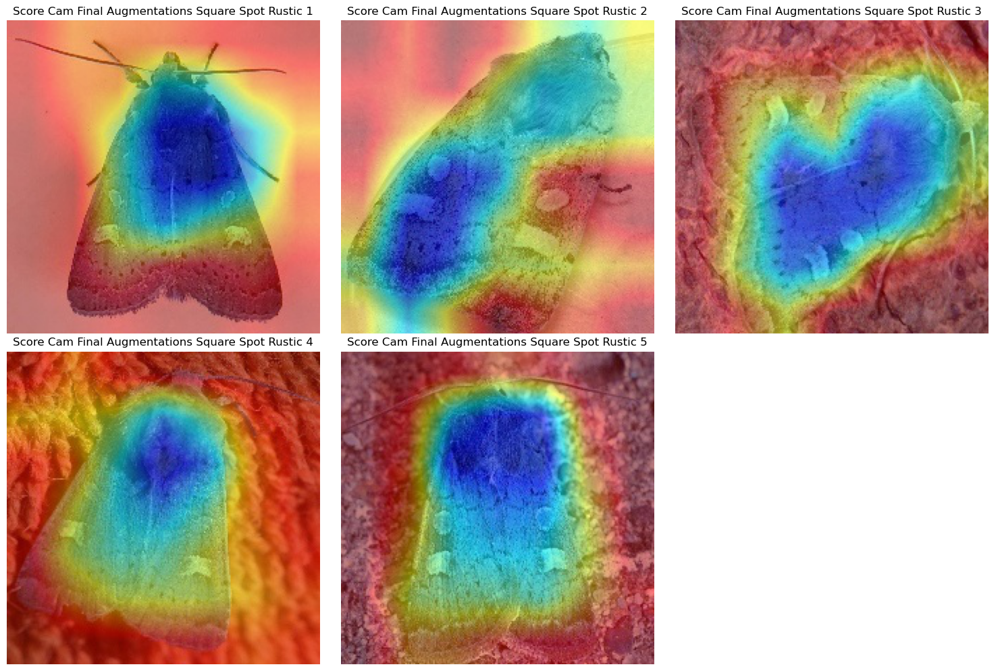

In [ ]:
base_path = Path("../cam_outputs/mobilenet_v2_ft") 

# Gather all Score-CAM images for Square Spot Rustic Moth with CutMix, standard augmentations, and targeted augmentations
image_paths = sorted(base_path.glob("score-cam-final-augmentations-square-spot-rustic-*.jpg"))

num_images = len(image_paths)
cols = 3
rows = (num_images + cols - 1) // cols
fig, axs = plt.subplots(rows, cols, figsize=(15, 5 * rows))

axs = axs.flatten()

for i, ax in enumerate(axs):
    if i < num_images:
        img = mpimg.imread(image_paths[i])
        ax.imshow(img)
        ax.set_title(image_paths[i].stem.replace("-", " ").title())
    ax.axis('off')

plt.tight_layout()
plt.show()

**Phase 4: Final Deep Fine-Tuning**  
For more in-depth fine-tuning, features[16,17,18] are unfrozen along with the classifier. Layer-wise learning rates and extended training are also applied:

Enhanced fine-tuning: 1,270,130/2,287,922 trainable params (55.5%)


Epoch 1/15: 100%|██████████| 591/591 [14:57<00:00,  1.52s/it]


Epoch 1: Train Acc: 64.58%, Val Acc: 94.00%


Epoch 2/15: 100%|██████████| 591/591 [14:33<00:00,  1.48s/it]


Epoch 2: Train Acc: 73.23%, Val Acc: 96.40%


Epoch 3/15: 100%|██████████| 591/591 [11:02<00:00,  1.12s/it]


Epoch 3: Train Acc: 75.88%, Val Acc: 97.20%


Epoch 4/15: 100%|██████████| 591/591 [08:54<00:00,  1.10it/s]


Epoch 4: Train Acc: 78.00%, Val Acc: 96.00%


Epoch 5/15: 100%|██████████| 591/591 [08:36<00:00,  1.14it/s]


Epoch 5: Train Acc: 76.36%, Val Acc: 96.40%


Epoch 6/15: 100%|██████████| 591/591 [08:17<00:00,  1.19it/s]


Epoch 6: Train Acc: 78.38%, Val Acc: 96.80%


Epoch 7/15: 100%|██████████| 591/591 [08:14<00:00,  1.20it/s]


Epoch 7: Train Acc: 76.36%, Val Acc: 95.60%


Epoch 8/15: 100%|██████████| 591/591 [08:36<00:00,  1.14it/s]


Epoch 8: Train Acc: 78.52%, Val Acc: 97.20%


Epoch 9/15: 100%|██████████| 591/591 [09:30<00:00,  1.04it/s]


Epoch 9: Train Acc: 78.85%, Val Acc: 96.80%


Epoch 10/15: 100%|██████████| 591/591 [11:43<00:00,  1.19s/it]


Epoch 10: Train Acc: 78.78%, Val Acc: 96.80%


Epoch 11/15: 100%|██████████| 591/591 [12:24<00:00,  1.26s/it]


Epoch 11: Train Acc: 78.12%, Val Acc: 96.40%


Epoch 12/15: 100%|██████████| 591/591 [11:17<00:00,  1.15s/it]


Epoch 12: Train Acc: 79.39%, Val Acc: 97.20%


Epoch 13/15: 100%|██████████| 591/591 [10:00<00:00,  1.02s/it]


Epoch 13: Train Acc: 79.71%, Val Acc: 96.40%


Epoch 14/15: 100%|██████████| 591/591 [09:48<00:00,  1.00it/s]


Epoch 14: Train Acc: 79.86%, Val Acc: 97.20%


Epoch 15/15: 100%|██████████| 591/591 [07:52<00:00,  1.25it/s]


Epoch 15: Train Acc: 80.29%, Val Acc: 98.00%


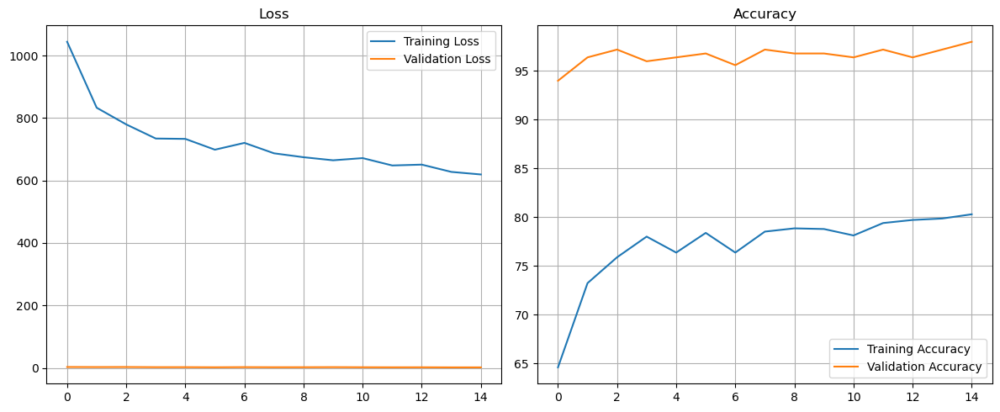

Test Accuracy: 100.00%
Classification Report:
                           precision    recall  f1-score   support

     ARCIGERA FLOWER MOTH       1.00      1.00      1.00         5
               ATLAS MOTH       1.00      1.00      1.00         5
        BANDED TIGER MOTH       1.00      1.00      1.00         5
  BIRD CHERRY ERMINE MOTH       1.00      1.00      1.00         5
        BLACK RUSTIC MOTH       1.00      1.00      1.00         5
             BLAIRS MOCHA       1.00      1.00      1.00         5
    BLOTCHED EMERALD MOTH       1.00      1.00      1.00         5
BLUE BORDERED CARPET MOTH       1.00      1.00      1.00         5
            CINNABAR MOTH       1.00      1.00      1.00         5
           CLEARWING MOTH       1.00      1.00      1.00         5
               COMET MOTH       1.00      1.00      1.00         5
    DEATHS HEAD HAWK MOTH       1.00      1.00      1.00         5
       ELEPHANT HAWK MOTH       1.00      1.00      1.00         5
         EMPERO

In [ ]:
# Import necessary packages for MobileNetV2 with CutMix, standard augmentations, targeted augmentations, and final deep fine-tuning
# Core imports
from pathlib import Path
import os
import random

# Numerics
import numpy as np

# Plotting (for training/validation curves)
import matplotlib.pyplot as plt

# PyTorch
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader

# Learning rate scheduler
from torch.optim.lr_scheduler import StepLR   

# Torchvision
from torchvision import transforms, datasets, models
from torchvision.models import MobileNet_V2_Weights  
from torchvision.transforms.v2 import CutMix  

# Progress bar
from tqdm import tqdm

# Evaluation
from sklearn.metrics import classification_report, confusion_matrix

# Set seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.cuda.manual_seed_all(seed)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# Device - tells PyTorch code to automatically select GPU if available, otherwise use CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define Paths
data_root = Path("../data/targeted_augmented_dataset")

# Enhanced transformations with Random Erasing
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225]),
    transforms.RandomErasing(p=0.3, scale=(0.02, 0.15), ratio=(0.3, 3.3)) # Random erasing
])

transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# Dictionary-style dataset and dataloader setup 
data_transforms = {
    'train': transform_train,
    'valid': transform_val_test,
    'test': transform_val_test
}

image_datasets = {
    split: datasets.ImageFolder(os.path.join(data_root, split), transform=data_transforms[split])
    for split in ['train', 'valid', 'test']
}

class_names = image_datasets['train'].classes
num_classes = len(class_names)

# CutMix setup
cutmix = CutMix(num_classes=num_classes)

def cutmix_collate(batch):
    imgs, targets = zip(*batch)
    imgs = torch.stack(imgs)
    targets = torch.tensor(targets)
    imgs, targets = cutmix(imgs, targets)
    return imgs, targets

# DataLoaders - only training uses CutMix
dataloaders = {
    'train': DataLoader(image_datasets['train'], batch_size=32, shuffle=True, 
                       num_workers=0, collate_fn=cutmix_collate), 
    'valid': DataLoader(image_datasets['valid'], batch_size=32, shuffle=False, num_workers=4),
    'test': DataLoader(image_datasets['test'], batch_size=32, shuffle=False, num_workers=4)
}

# Load MobileNetV2 model with pretrained weights
weights = MobileNet_V2_Weights.DEFAULT
model = models.mobilenet_v2(weights=weights)
# Replace just the final classification layer 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

# Deeper unfreezing - unfreeze last 3 feature blocks + classifier
for param in model.parameters():
    param.requires_grad = False
# MobileNetV2 has features.16, features.17, features.18 - unfreeze last 3 blocks
for name, param in model.named_parameters():
    if any(block in name for block in ["features.16", "features.17", "features.18"]) or "classifier" in name:
        param.requires_grad = True

model.to(device)

# Discriminative learning rates setup
base_lr = 1e-3
param_groups = []

# Group parameters by feature blocks
for name, param in model.named_parameters():
    if param.requires_grad:
        if "features.16" in name:
            param_groups.append({'params': [param], 'lr': base_lr * 0.1})  # Conservative
        elif "features.17" in name:
            param_groups.append({'params': [param], 'lr': base_lr * 0.5})  # Moderate
        elif "features.18" in name:
            param_groups.append({'params': [param], 'lr': base_lr * 0.8})  # Aggressive
        elif "classifier" in name:
            param_groups.append({'params': [param], 'lr': base_lr})        # Most aggressive

optimiser = optim.Adam(param_groups, weight_decay=1e-4)
scheduler = StepLR(optimiser, step_size=7, gamma=0.5)

# Count trainable parameters for reference
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Enhanced fine-tuning: {trainable_params:,}/{total_params:,} trainable params ({100*trainable_params/total_params:.1f}%)")

# Loss and optimiser for calculating error and adjusting for model improvement
criterion = nn.CrossEntropyLoss()

# Training
train_loss_list, val_loss_list = [], []
train_acc_list, val_acc_list = [], []
epochs = 15

for epoch in range(epochs):
    model.train()
    total_loss, total_correct, total_samples = 0, 0, 0

    for x, y in tqdm(dataloaders['train'], desc=f"Epoch {epoch+1}/{epochs}"):
        x, y = x.to(device), y.to(device)
        optimiser.zero_grad()
        output = model(x)
        loss = criterion(output, y)
        loss.backward()
        optimiser.step()

        total_loss += loss.item()
        total_correct += (output.argmax(1) == y.argmax(1)).sum().item()
        total_samples += y.size(0)

    train_loss_list.append(total_loss)
    train_acc_list.append(100 * total_correct / total_samples)

    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0
    with torch.no_grad():
        for x, y in dataloaders['valid']:
            x, y = x.to(device), y.to(device)
            output = model(x)
            loss = criterion(output, y)
            val_loss += loss.item()
            val_correct += (output.argmax(1) == y).sum().item()
            val_total += y.size(0)

    val_loss_list.append(val_loss)
    val_acc_list.append(100 * val_correct / val_total)

    print(f"Epoch {epoch+1}: Train Acc: {train_acc_list[-1]:.2f}%, Val Acc: {val_acc_list[-1]:.2f}%")
    
    scheduler.step()

# Plot
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_loss_list, label="Training Loss")
plt.plot(val_loss_list, label="Validation Loss")
plt.legend()
plt.title("Loss")
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(train_acc_list, label="Training Accuracy")
plt.plot(val_acc_list, label="Validation Accuracy")
plt.legend()
plt.title("Accuracy")
plt.grid(True)

plt.tight_layout()
plt.show()

# Test evaluation
model.eval()
all_preds, all_labels = [], []
test_correct, test_total = 0, 0

with torch.no_grad():
    for x, y in dataloaders['test']:
        x, y = x.to(device), y.to(device)
        output = model(x)
        pred = output.argmax(1)
        all_preds.extend(pred.cpu().numpy())
        all_labels.extend(y.cpu().numpy())
        test_correct += (pred == y).sum().item()
        test_total += y.size(0)

print(f"Test Accuracy: {100 * test_correct / test_total:.2f}%")
print("Classification Report:")
print(classification_report(all_labels, all_preds, target_names=class_names))

# Confused pairs
cm = confusion_matrix(all_labels, all_preds)
cm_copy = cm.copy()
np.fill_diagonal(cm_copy, 0)
confused = np.argwhere(cm_copy > 0)

print("Confused Class Pairs:")
for i, (true, pred) in enumerate(confused):
    count = cm[true, pred]
    print(f"{i+1}. True: {class_names[true]} ↔ Pred: {class_names[pred]} ({count} times)")

In [17]:
torch.save(model.state_dict(), "mobilenet_v2_final_finetuning.pth")

### Attention Pattern Analysis after Final Deep Fine-Tuning  

The analysis now examines the final attention patterns of the originally confused species pairs following completion of the full optimisation pipeline.  

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the original Banded Tiger Moth test image
image_path = "../data/kaggle-dataset/archive/test/BANDED TIGER MOTH/1.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-banded-tiger-1.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:16<00:00,  4.99it/s]


True

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the original Garden Tiger Moth test image
image_path = "../data/kaggle-dataset/archive/test/GARDEN TIGER MOTH/1.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-garden-tiger-1.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:15<00:00,  5.05it/s]


True

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the original Hummingbird Hawk Moth test image
image_path = "../data/kaggle-dataset/archive/test/HUMMING BIRD HAWK MOTH/1.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-humming-bird-hawk-1.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:16<00:00,  4.99it/s]


True

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the original Eyed Hawk Moth test image
image_path = "../data/kaggle-dataset/archive/test/EYED HAWK MOTH/1.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-eyed-hawk-1.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:16<00:00,  4.97it/s]


True

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the original Muslin Moth test image
image_path = "../data/kaggle-dataset/archive/test/MUSLIN MOTH/1.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-muslin-1.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:15<00:00,  5.04it/s]


True

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  

model = models.mobilenet_v2(pretrained=False) 
model.classifier[1] = nn.Linear(model.classifier[1].in_features, 50) 
model.load_state_dict(torch.load("mobilenet_v2_final_finetuning.pth", map_location=device)) 
model.to(device) 
model.eval()  

# Load and normalise the original Square Spot Rustic Moth test image
image_path = "../data/kaggle-dataset/archive/test/SQUARE SPOT RUSTIC MOTH/1.jpg" 
image = Image.open(image_path).convert("RGB")
rgb_img = np.array(image.resize((224, 224))) / 255.0  

weights = MobileNet_V2_Weights.DEFAULT
transform = weights.transforms()  
input_tensor = transform(image).unsqueeze(0).to(device)

target_layer = model.features[18]  

cam = ScoreCAM(model=model, target_layers=[target_layer])  

grayscale_cam = cam(input_tensor=input_tensor)[0] 
visualisation = show_cam_on_image(rgb_img.astype(np.float32), grayscale_cam, use_rgb=True)  

output_path = Path("../cam_outputs/mobilenet_v2_ft/score-cam-final-finetuning-square-spot-rustic-1.jpg") 
cv2.imwrite(str(output_path), visualisation) 

100%|██████████| 80/80 [00:15<00:00,  5.11it/s]


True

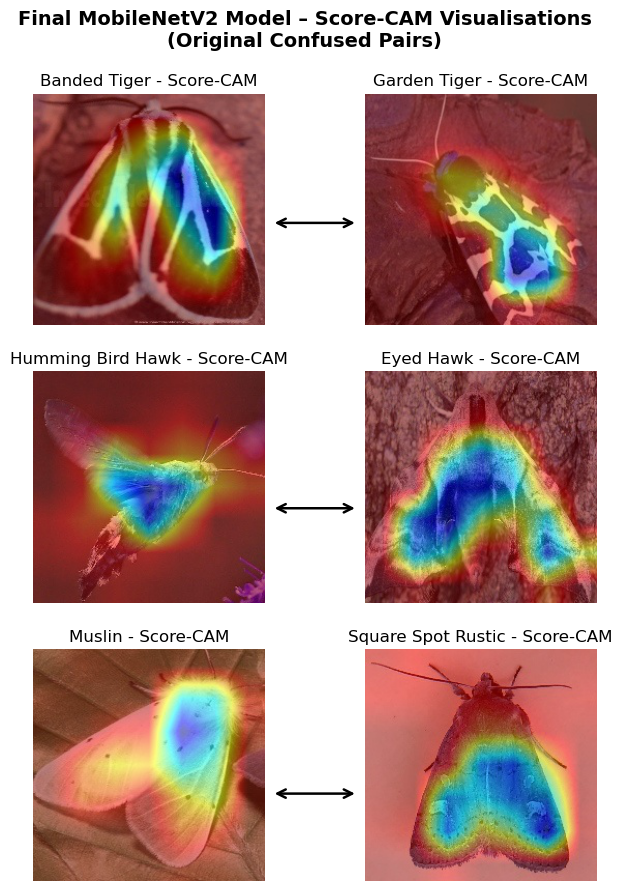

In [ ]:
from matplotlib.patches import FancyArrowPatch, Rectangle, Patch

# Define Score-CAM image paths for confused pairs
species_pairs = [
    ("banded-tiger", "garden-tiger"),
    ("humming-bird-hawk", "eyed-hawk"),
    ("muslin", "square-spot-rustic")
]

# Species still misclassified after fine-tuning
base_path = Path("../cam_outputs/mobilenet_v2_ft")
fig, axs = plt.subplots(
    len(species_pairs), 2,
    figsize=(8, len(species_pairs) * 3.5),
    gridspec_kw={"wspace": 0.15}
)

for i, (sp1, sp2) in enumerate(species_pairs):
    img1 = mpimg.imread(base_path / f"score-cam-final-finetuning-{sp1}-1.jpg")
    img2 = mpimg.imread(base_path / f"score-cam-final-finetuning-{sp2}-1.jpg")

    axs[i, 0].imshow(img1)
    axs[i, 0].axis('off')
    axs[i, 0].set_title(f"{sp1.replace('-', ' ').title()} - Score-CAM")

    axs[i, 1].imshow(img2)
    axs[i, 1].axis('off')
    axs[i, 1].set_title(f"{sp2.replace('-', ' ').title()} - Score-CAM")


# Add double-headed arrows
for row in range(len(species_pairs)):
    bbox1 = axs[row, 0].get_position()
    bbox2 = axs[row, 1].get_position()

    start_x = bbox1.x1 + 0.005
    end_x = bbox2.x0 - 0.005
    y_center = (bbox1.y0 + bbox1.y1) / 2

    arrow = FancyArrowPatch(
        (start_x, y_center),
        (end_x, y_center),
        transform=fig.transFigure,
        arrowstyle='<->',
        mutation_scale=15,
        color='black',
        linewidth=1.8
    )
    fig.patches.append(arrow)

# Add a main title
fig.suptitle(
    "Final MobileNetV2 Model – Score-CAM Visualisations\n(Original Confused Pairs)",
    fontsize=14,
    fontweight="bold",
    y=0.97
)

plt.subplots_adjust(top=0.89, bottom=0.14)  
plt.show()